In [1]:
import pandas as pd
import numpy as np

from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules


import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

# Importing files

Importing the rating file

In [2]:
rating_complete = pd.read_feather('archive/rating_complete.feather')
rating_complete.head()

,user_id,anime_id,rating
0,0,430,9
1,0,1004,5
2,0,3010,7
3,0,570,7
4,0,2762,9


Importing the anime file

In [3]:
anime = pd.read_csv('archive/selected_animes.csv')
anime.head()

,anime_id,Name,Score,Genres,English name,Japanese name,Type,Episodes,Aired,Premiered,...,Score-10,Score-9,Score-8,Score-7,Score-6,Score-5,Score-4,Score-3,Score-2,Score-1
0,5114,Fullmetal Alchemist: Brotherhood,9.19,"Action, Military, Adventure, Comedy, Drama, Ma...",Fullmetal Alchemist:Brotherhood,鋼の錬金術師 FULLMETAL ALCHEMIST,TV,64,"Apr 5, 2009 to Jul 4, 2010",Spring 2009,...,714811.0,401507.0,199160.0,70045.0,20210.0,9308.0,3222.0,1536.0,2162.0,16806.0
1,40028,Shingeki no Kyojin: The Final Season,9.17,"Action, Military, Mystery, Super Power, Drama,...",Attack on Titan Final Season,進撃の巨人 The Final Season,TV,16,"Dec 7, 2020 to ?",Winter 2021,...,173154.0,63756.0,26016.0,8793.0,2674.0,1336.0,588.0,382.0,514.0,11061.0
2,9253,Steins;Gate,9.11,"Thriller, Sci-Fi",Steins;Gate,STEINS;GATE,TV,24,"Apr 6, 2011 to Sep 14, 2011",Spring 2011,...,468504.0,275960.0,140914.0,57740.0,21375.0,11126.0,5061.0,2292.0,1678.0,5255.0
3,11061,Hunter x Hunter (2011),9.10,"Action, Adventure, Fantasy, Shounen, Super Power",Hunter x Hunter,HUNTER×HUNTER（ハンター×ハンター）,TV,148,"Oct 2, 2011 to Sep 24, 2014",Fall 2011,...,454000.0,304741.0,167331.0,65085.0,18241.0,7789.0,2780.0,1243.0,1054.0,4602.0
4,28977,Gintama°,9.10,"Action, Comedy, Historical, Parody, Samurai, S...",Gintama Season 4,銀魂°,TV,51,"Apr 8, 2015 to Mar 30, 2016",Spring 2015,...,78918.0,37902.0,21360.0,10215.0,3898.0,2311.0,952.0,648.0,1100.0,4508.0


# User Preference

we create a merging of rating and anime files for 4 columns - users, anime, genre, ratings

In [4]:
user_pref = pd.merge(rating_complete, anime[['anime_id', 'Name', 'Genres']],on = 'anime_id', how = 'inner')
user_pref

,user_id,anime_id,rating,Name,Genres
0,0,3010,7,Kaiketsu Zorro,"Adventure, Historical, Shounen"
1,53,3010,8,Kaiketsu Zorro,"Adventure, Historical, Shounen"
2,198,3010,7,Kaiketsu Zorro,"Adventure, Historical, Shounen"
3,478,3010,6,Kaiketsu Zorro,"Adventure, Historical, Shounen"
4,542,3010,8,Kaiketsu Zorro,"Adventure, Historical, Shounen"
...,...,...,...,...,...
6797862,205301,36184,9,Feng Ling Yu Xiu,"Adventure, Martial Arts"
6797863,299795,36184,4,Feng Ling Yu Xiu,"Adventure, Martial Arts"
6797864,172319,42897,10,Horimiya,"Slice of Life, Comedy, Romance, School, Shounen"
6797865,203943,42897,7,Horimiya,"Slice of Life, Comedy, Romance, School, Shounen"


arverage the rating by all users to animes

In [5]:
rating_animeid = user_pref.groupby('anime_id')['rating'].mean().reset_index()
rating_animeid.sort_values(by = 'rating', ascending = False)

,anime_id,rating
645,28977,9.245648
295,5114,9.237010
76,820,9.224730
418,9253,9.184228
454,11061,9.169439
...,...,...
910,38748,3.098214
655,29979,2.993007
677,30814,2.941176
578,22167,2.819444


put average user ratings to animes to get genres

In [6]:
# Merging to get genres
genre_ratings = pd.merge(rating_animeid, user_pref[['anime_id', 'Genres']], on ='anime_id', 
                         how = 'inner').drop_duplicates()
genre_ratings

,anime_id,rating,Genres
0,1,8.763003,"Action, Adventure, Comedy, Drama, Sci-Fi, Space"
79714,8,7.150594,"Adventure, Fantasy, Shounen, Supernatural"
81228,19,8.924509,"Drama, Horror, Mystery, Police, Psychological,..."
113722,26,7.840979,"Action, Sci-Fi, Psychological, Drama"
124142,44,8.770622,"Action, Historical, Drama, Romance, Martial Ar..."
...,...,...,...
6794995,43590,6.903614,"Music, Drama"
6795161,43779,6.509202,"Comedy, Romance, Ecchi"
6795324,44044,5.718404,"Romance, Ecchi"
6795775,46491,5.492582,Fantasy


explode the genres

In [7]:
# Taking average ratings for genres
genre_ratings['Genres'] = genre_ratings['Genres'].str.split(', ')
genre_ratings_exploded = genre_ratings.explode('Genres')
genre_ratings_exploded

,anime_id,rating,Genres
0,1,8.763003,Action
0,1,8.763003,Adventure
0,1,8.763003,Comedy
0,1,8.763003,Drama
0,1,8.763003,Sci-Fi
...,...,...,...
6796112,47616,4.657550,Mystery
6796112,47616,4.657550,Psychological
6796112,47616,4.657550,Supernatural
6796112,47616,4.657550,Thriller


take average across genres

In [8]:
data = genre_ratings_exploded.groupby('Genres')['rating'].mean().reset_index().sort_values(
    by = 'rating', ascending = False).head()

In [9]:
data

,Genres,rating
25,Samurai,7.993994
20,Mystery,7.303464
6,Drama,7.239788
31,Shounen,7.204069
13,Josei,7.131395


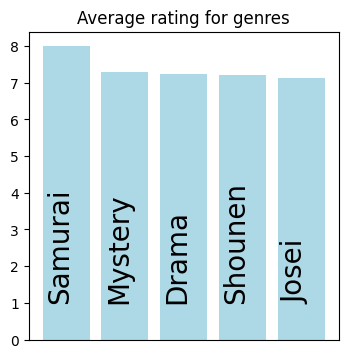

In [10]:
# make a barchart
plt.figure(figsize = (4, 4))
# sns.barplot(x = 'rating', y = 'Genres', data = data)
bars = plt.bar(x = data.Genres, height = data.rating, color = 'lightblue')
# remove x label
plt.xticks([])
plt.title('Average rating for genres')

# Add player names on top of the bars
for bar, player in zip(bars, data.Genres):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.1, 1,
             player, 
             ha='center', 
             va='bottom', 
             rotation=90,
             fontsize=20)
    
plt.show()

<b> Inference: Top 5 genres are Samurai, Mystery, Drama, Shounen, Josei</b>

# Jaccard similarities of two movies based on genres

In [12]:
a, b, c = 5114, 40028, 9253

In [13]:
genre_ratings

,anime_id,rating,Genres
0,1,8.763003,"[Action, Adventure, Comedy, Drama, Sci-Fi, Space]"
79714,8,7.150594,"[Adventure, Fantasy, Shounen, Supernatural]"
81228,19,8.924509,"[Drama, Horror, Mystery, Police, Psychological..."
113722,26,7.840979,"[Action, Sci-Fi, Psychological, Drama]"
124142,44,8.770622,"[Action, Historical, Drama, Romance, Martial A..."
...,...,...,...
6794995,43590,6.903614,"[Music, Drama]"
6795161,43779,6.509202,"[Comedy, Romance, Ecchi]"
6795324,44044,5.718404,"[Romance, Ecchi]"
6795775,46491,5.492582,[Fantasy]


In [14]:
genre_ratings[genre_ratings['anime_id'] == a]

,anime_id,rating,Genres
2251024,5114,9.23701,"[Action, Military, Adventure, Comedy, Drama, M..."


In [15]:
tweet_df = genre_ratings.reset_index(drop=True)
tweet_df.columns = ['tweet_text', 'rating', 'emoji']
tweet_df.drop(columns=['rating'], inplace=True)
tweet_df.head()

,tweet_text,emoji
0,1,"[Action, Adventure, Comedy, Drama, Sci-Fi, Space]"
1,8,"[Adventure, Fantasy, Shounen, Supernatural]"
2,19,"[Drama, Horror, Mystery, Police, Psychological..."
3,26,"[Action, Sci-Fi, Psychological, Drama]"
4,44,"[Action, Historical, Drama, Romance, Martial A..."


In [16]:
tweet_df[tweet_df['tweet_text'] == b]

,tweet_text,emoji
935,40028,"[Action, Military, Mystery, Super Power, Drama..."


In [17]:
# Complete a function, ‘jaccard_similarity’, to calculate the Jaccard similarity
# between two sets

def jaccard_similarity(set1, set2):
    # print(set1)
    # print(set2)
    return len(set1.intersection(set2)) / len(set1.union(set2))

In [18]:
# apply the function to any tweet_df['emoji'] in the dataset and return the top 5 most similar tweets
# (based on Jaccard similarity) to the input tweet

def find_similar_tweets(tweet, df): #, n=5
    # print('Tweet:', frozenset(tweet))
    # Calculate the Jaccard similarity between the tweet and all other tweets
    similarities = df['emoji'].apply(
        lambda x: jaccard_similarity(frozenset(tweet), frozenset(x)))

    # Sort by descending similarity
    similarities = similarities.sort_values(ascending=False)

    # Return the top n most similar tweets
    return similarities #.iloc[1:n+1]

In [19]:
# store in a dataframe along with the Jaccard similarity score
tweet_index = 295
similar_tweets = pd.DataFrame(
    find_similar_tweets(tweet_df['emoji'][tweet_index], tweet_df))
similar_tweets

,emoji
295,1.000000
744,0.750000
892,0.666667
580,0.625000
56,0.625000
...,...
569,0.000000
560,0.000000
824,0.000000
559,0.000000


In [20]:
# for top 5 most similar tweets
# from index, get the tweet text and the Jaccard similarity score

text_list = []
score_list = []
emoji_list = []

for index, row in similar_tweets.iterrows():
    text_list.append(tweet_df['tweet_text'][index])
    score_list.append(row[0])
    emoji_list.append(tweet_df['emoji'][index])

# create a dataframe with the tweet text, Jaccard similarity score, and emoji
similar_tweets_df = pd.DataFrame(
    {'tweet_text': text_list, 'score': score_list, 'emoji': emoji_list})
similar_tweets_df.columns = ['anime_id', 'Jaccard similarity score', 'Genres']
anime_genres = similar_tweets_df.head()
anime_genres


,anime_id,Jaccard similarity score,Genres
0,5114,1.000000,"[Action, Military, Adventure, Comedy, Drama, M..."
1,33338,0.750000,"[Action, Adventure, Comedy, Drama, Fantasy, Sh..."
2,38234,0.666667,"[Action, Adventure, Comedy, Drama, Fantasy, Sh..."
3,22199,0.625000,"[Action, Adventure, Drama, Fantasy, Shounen]"
4,536,0.625000,"[Adventure, Comedy, Magic, Fantasy, Shounen]"


In [21]:
# merge the anime_genres dataframe with the anime dataframe to get the anime name
anime_genres = pd.merge(anime_genres, anime[['anime_id', 'Name']], on='anime_id', how='inner')
anime_genres

,anime_id,Jaccard similarity score,Genres,Name
0,5114,1.000000,"[Action, Military, Adventure, Comedy, Drama, M...",Fullmetal Alchemist: Brotherhood
1,33338,0.750000,"[Action, Adventure, Comedy, Drama, Fantasy, Sh...",One Piece: Heart of Gold
2,38234,0.666667,"[Action, Adventure, Comedy, Drama, Fantasy, Sh...",One Piece Movie 14: Stampede
3,22199,0.625000,"[Action, Adventure, Drama, Fantasy, Shounen]",Akame ga Kill!
4,536,0.625000,"[Adventure, Comedy, Magic, Fantasy, Shounen]",Slayers: The Motion Picture


In [22]:
# export the dataframe to a csv file
anime_genres.to_csv('anime_genres.csv', index=False)

## Apriori algorithm

one hot encode genres

In [23]:
encoded_genres = (user_pref[['anime_id', 'Genres']].drop_duplicates()).join(
    user_pref[['anime_id', 'Genres']].drop_duplicates().Genres.str.get_dummies(', '))
encoded_genres = encoded_genres.drop(columns = ['Genres'])
encoded_genres

,anime_id,Action,Adventure,Cars,Comedy,Dementia,Demons,Drama,Ecchi,Fantasy,...,Shounen,Shounen Ai,Slice of Life,Space,Sports,Super Power,Supernatural,Thriller,Vampire,Yaoi
0,3010,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1565,431,0,1,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
94068,600,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,1,0
95918,164,1,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
183132,199,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6797725,23303,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
6797770,14529,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6797827,3768,1,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
6797858,36184,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
# make anime_id the index
encoded_genres_2 = encoded_genres.set_index('anime_id')
encoded_genres_2

,Action,Adventure,Cars,Comedy,Dementia,Demons,Drama,Ecchi,Fantasy,Game,...,Shounen,Shounen Ai,Slice of Life,Space,Sports,Super Power,Supernatural,Thriller,Vampire,Yaoi
anime_id,,,,,,,,,,,,,,,,,,,,,
3010,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
431,0,1,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
600,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
164,1,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
199,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23303,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
14529,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3768,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


In [25]:
from mlxtend.frequent_patterns import apriori
def emoji_frequent_itemsets(df, min_support, min_len):
    frequent_itemsets = apriori(df, min_support=min_support, use_colnames=True, max_len=None)
    frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))
    frequent_itemsets = frequent_itemsets[frequent_itemsets['length'] >= min_len]
    frequent_itemsets = frequent_itemsets.sort_values(by='support', ascending=False)
    return frequent_itemsets

# Find all the frequent itemsets with a minimal support of 0.02.
frequent_itemsets = emoji_frequent_itemsets(encoded_genres_2, 0.002, 2)
frequent_itemsets

,support,itemsets,length
66,0.106061,"(Sci-Fi, Action)",2
70,0.091919,"(Shounen, Action)",2
41,0.087879,"(Adventure, Action)",2
138,0.087879,"(Shounen, Comedy)",2
43,0.087879,"(Comedy, Action)",2
...,...,...,...
1443,0.002020,"(Fantasy, Martial Arts, Action, Comedy)",4
1440,0.002020,"(Fantasy, Historical, Action, Comedy)",4
1439,0.002020,"(Shounen, Comedy, Ecchi, Action)",4
1438,0.002020,"(Sci-Fi, Comedy, Ecchi, Action)",4


In [26]:
frequent_itemsets_hash = apriori(encoded_genres_2, min_support=0.002, use_colnames=True)
frequent_itemsets_hash

,support,itemsets
0,0.290909,(Action)
1,0.195960,(Adventure)
2,0.005051,(Cars)
3,0.377778,(Comedy)
4,0.021212,(Dementia)
...,...,...
2504,0.009091,"(Historical, Samurai, Shounen, Sci-Fi, Comedy,..."
2505,0.002020,"(Super Power, Mystery, Shounen, Military, Fant..."
2506,0.002020,"(Magic, Comedy, Adventure, Shoujo, Fantasy, Ro..."
2507,0.003030,"(Seinen, Supernatural, Historical, Adventure, ..."


In [27]:
from mlxtend.frequent_patterns import association_rules
rules = association_rules(frequent_itemsets_hash, metric="lift", min_threshold=3)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Super Power),(Action),0.049495,0.290909,0.043434,0.877551,3.016582,0.029036,5.790909,0.703309
1,(Action),(Super Power),0.290909,0.049495,0.043434,0.149306,3.016582,0.029036,1.117328,0.942755
2,(Shounen),(Cars),0.177778,0.005051,0.003030,0.017045,3.375000,0.002132,1.012203,0.855856
3,(Cars),(Shounen),0.005051,0.177778,0.003030,0.600000,3.375000,0.002132,2.055556,0.707276
4,(Sports),(Cars),0.059596,0.005051,0.003030,0.050847,10.067797,0.002729,1.048250,0.957752
...,...,...,...,...,...,...,...,...,...,...
21271,(School),"(Ecchi, Shounen, Harem, Fantasy, Comedy, Romance)",0.132323,0.002020,0.002020,0.015267,7.557252,0.001753,1.013452,1.000000
21272,(Shounen),"(Ecchi, Comedy, School, Harem, Fantasy, Romance)",0.177778,0.002020,0.002020,0.011364,5.625000,0.001661,1.009451,1.000000
21273,(Harem),"(Ecchi, School, Shounen, Fantasy, Comedy, Roma...",0.025253,0.002020,0.002020,0.080000,39.600000,0.001969,1.084761,1.000000
21274,(Fantasy),"(Ecchi, School, Shounen, Harem, Comedy, Romance)",0.197980,0.002020,0.002020,0.010204,5.051020,0.001620,1.008268,1.000000


# User clustering based on ratings to genre's clusters

## Heirarchical clustering to genres

In [28]:
genre_matrix = encoded_genres_2.copy() #.drop(columns = ['Name'])

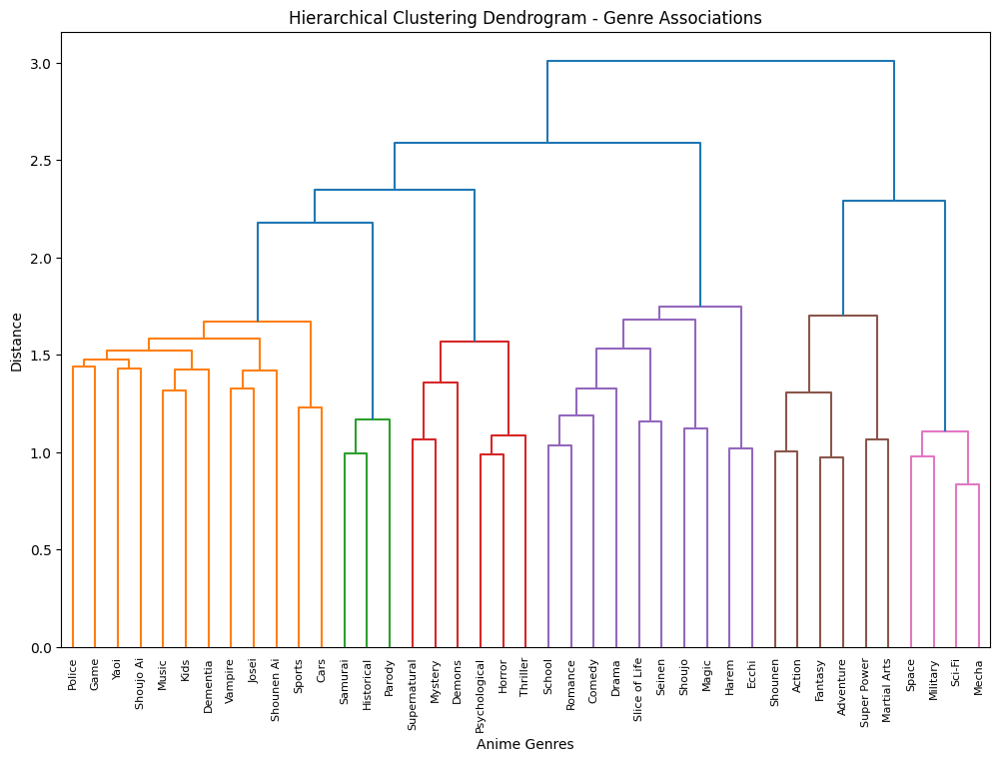

In [29]:
# Calculate cosine similarity between genres
similarity_matrix = cosine_similarity(genre_matrix.T)  

# Perform hierarchical clustering
linkage_matrix = linkage(similarity_matrix, method='ward')

num_clusters = 3
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
genre_matrix.reset_index(drop=True, inplace=True)

# Plot the dendrogram
plt.figure(figsize=(12, 8))
dendrogram(linkage_matrix, labels=genre_matrix.columns, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram - Genre Associations')
plt.xlabel('Anime Genres')
plt.ylabel('Distance')
plt.show()

In [30]:
genres = pd.DataFrame(genre_matrix.columns)
genres['Cluster'] = cluster_labels
genres = genres.rename(columns = {0:'Genres'})
genres.head(10)

,Genres,Cluster
0,Action,1
1,Adventure,1
2,Cars,3
3,Comedy,2
4,Dementia,3
5,Demons,3
6,Drama,2
7,Ecchi,2
8,Fantasy,1
9,Game,3


In [31]:
anime_cluster = genre_ratings_exploded.copy().drop(columns = ['rating'])
anime_cluster

,anime_id,Genres
0,1,Action
0,1,Adventure
0,1,Comedy
0,1,Drama
0,1,Sci-Fi
...,...,...
6796112,47616,Mystery
6796112,47616,Psychological
6796112,47616,Supernatural
6796112,47616,Thriller


In [32]:
# give unique genres in a list
list= anime_cluster['Genres'].unique().tolist()
# list

In [33]:
# replace genres with cluster labels in genre_ratings_exploded
anime_cluster['Genres'] = anime_cluster['Genres'].map(genres.set_index('Genres')['Cluster'])
anime_cluster.rename(columns = {'Genres':'Genre_Cluster'}, inplace = True)
anime_cluster

,anime_id,Genre_Cluster
0,1,1
0,1,1
0,1,2
0,1,2
0,1,1
...,...,...
6796112,47616,3
6796112,47616,3
6796112,47616,3
6796112,47616,3


applying heirarchical clustering to group anime rating for each cluster

In [34]:
# merge anime_cluster with user_pref
user_pref_cluster = pd.merge(user_pref, anime_cluster, on = 'anime_id', how = 'left')
user_pref_cluster

,user_id,anime_id,rating,Name,Genres,Genre_Cluster
0,0,3010,7,Kaiketsu Zorro,"Adventure, Historical, Shounen",1
1,0,3010,7,Kaiketsu Zorro,"Adventure, Historical, Shounen",3
2,0,3010,7,Kaiketsu Zorro,"Adventure, Historical, Shounen",1
3,53,3010,8,Kaiketsu Zorro,"Adventure, Historical, Shounen",1
4,53,3010,8,Kaiketsu Zorro,"Adventure, Historical, Shounen",3
...,...,...,...,...,...,...
31419486,340315,42897,8,Horimiya,"Slice of Life, Comedy, Romance, School, Shounen",2
31419487,340315,42897,8,Horimiya,"Slice of Life, Comedy, Romance, School, Shounen",2
31419488,340315,42897,8,Horimiya,"Slice of Life, Comedy, Romance, School, Shounen",2
31419489,340315,42897,8,Horimiya,"Slice of Life, Comedy, Romance, School, Shounen",2


In [35]:
# group by user_id and Genre_Cluster and calculate mean rating
user_cluster_rating = user_pref_cluster.groupby(['user_id', 'Genre_Cluster'])['rating'].mean().reset_index()
user_cluster_rating

,user_id,Genre_Cluster,rating
0,0,1,7.666667
1,0,2,7.400000
2,0,3,6.666667
3,1,1,8.760870
4,1,2,8.763158
...,...,...,...
860388,353403,1,9.400000
860389,353403,2,9.562500
860390,353403,3,9.625000
860391,353404,1,6.600000


In [36]:
# pivot the table to get Genre_Cluster as columns
user_cluster_rating_pivot = user_cluster_rating.pivot(index = 'user_id', columns = 'Genre_Cluster', values = 'rating').fillna(0)
user_cluster_rating_pivot

Genre_Cluster,1,2,3
user_id,,,
0,7.666667,7.400000,6.666667
1,8.760870,8.763158,8.714286
2,9.200000,9.000000,8.285714
3,7.763158,7.454545,7.586207
4,8.461538,8.200000,7.375000
...,...,...,...
353400,9.166667,9.454545,9.142857
353401,8.896552,9.222222,7.333333
353402,7.800000,7.090909,7.500000


cluster the anime based on 3D vector

In [37]:
# k means clustering with 4 clusters
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=0).fit(user_cluster_rating_pivot)
user_cluster_rating_pivot['Cluster'] = kmeans.labels_
user_cluster_rating_pivot

Genre_Cluster,1,2,3,Cluster
user_id,,,,
0,7.666667,7.400000,6.666667,3
1,8.760870,8.763158,8.714286,0
2,9.200000,9.000000,8.285714,0
3,7.763158,7.454545,7.586207,3
4,8.461538,8.200000,7.375000,3
...,...,...,...,...
353400,9.166667,9.454545,9.142857,0
353401,8.896552,9.222222,7.333333,0
353402,7.800000,7.090909,7.500000,3


In [38]:
# %pip install --upgrade nbformat

In [39]:
# what is version of nbformat?
import nbformat
nbformat.__version__

'5.9.2'

In [40]:
user_cluster_rating_pivot.to_csv('user_cluster_rating_pivot.csv', index = True)

In [41]:
import plotly.express as px
fig  = px.scatter_3d(user_cluster_rating_pivot.sample(100000, random_state=42), x=1, y=2, z=3
                     , color='Cluster', opacity=0.5, size_max=5)
fig.show()

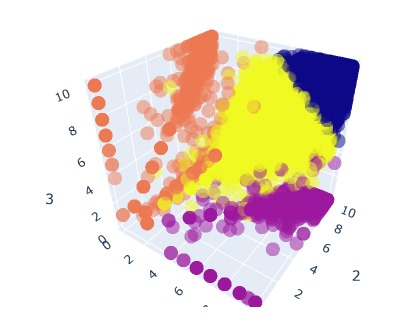

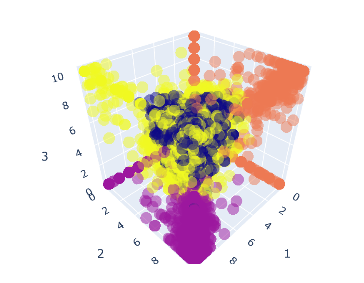

# Word cloud of various genres

In [42]:
synopsis_1 = pd.read_csv('archive/anime_with_synopsis.csv')
# replace unknown score with 0
synopsis_1.loc[synopsis_1['Score'] == 'Unknown', 'Score'] = 0
# synopsis_1= synopsis_1[synopsis_1['Score'] == 'Unknown'].replace('Unknown', 0)
synopsis_1.Score = synopsis_1.Score.astype(float)
synopsis_1.rename(columns = {'sypnopsis':'synopsis'}, inplace = True)
synopsis_1['synopsis'].fillna('Unknown', inplace=True)
print(synopsis_1.shape)
synopsis_1.head()

(16214, 5)


,MAL_ID,Name,Score,Genres,synopsis
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space","In the year 2071, humanity has colonized sever..."
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space","other day, another bounty—such is the life of ..."
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen","Vash the Stampede is the man with a $$60,000,0..."
3,7,Witch Hunter Robin,7.27,"Action, Mystery, Police, Supernatural, Drama, ...",ches are individuals with special powers like ...
4,8,Bouken Ou Beet,6.98,"Adventure, Fantasy, Shounen, Supernatural",It is the dark century and the people are suff...


In [43]:
# take only that rows with Adventure in Genres list
synopsis_3 = synopsis_1[synopsis_1['Genres'].str.contains('Sci-Fi')]
print(synopsis_3.shape)
synopsis_3.head()

(2551, 5)


,MAL_ID,Name,Score,Genres,synopsis
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space","In the year 2071, humanity has colonized sever..."
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space","other day, another bounty—such is the life of ..."
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen","Vash the Stampede is the man with a $$60,000,0..."
15,25,Sunabouzu,7.42,"Action, Adventure, Comedy, Ecchi, Sci-Fi, Shounen","The Great Kanto Desert, a sweltering wasteland..."
16,26,Texhnolyze,7.76,"Action, Sci-Fi, Psychological, Drama","Texhnolyze takes place in the city of Lux, a m..."


In [44]:
synopsis_4 = synopsis_1[synopsis_1['Genres'].str.contains('Romance')]
print(synopsis_4.shape)
synopsis_4.head()

(1852, 5)


,MAL_ID,Name,Score,Genres,synopsis
6,16,Hachimitsu to Clover,8.06,"Comedy, Drama, Josei, Romance, Slice of Life","Yuuta Takemoto, a sophomore at an arts college..."
14,24,School Rumble,7.94,"Comedy, Romance, School, Shounen","Just the words ""I love you,"" and everything ch..."
23,33,Kenpuu Denki Berserk,8.49,"Action, Adventure, Demons, Drama, Fantasy, Hor...","Born from the corpse of his mother, a young me..."
25,44,Rurouni Kenshin: Meiji Kenkaku Romantan - Tsui...,8.73,"Action, Historical, Drama, Romance, Martial Ar...",hen mankind's savagery surpasses his fear of d...
26,45,Rurouni Kenshin: Meiji Kenkaku Romantan,8.31,"Action, Adventure, Comedy, Historical, Romance...",In the final years of the Bakumatsu era lived ...


In [45]:
synopsis_5 = synopsis_1[synopsis_1['Genres'].str.contains('Action')]
print(synopsis_5.shape)
synopsis_5.head()

(3846, 5)


,MAL_ID,Name,Score,Genres,synopsis
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space","In the year 2071, humanity has colonized sever..."
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space","other day, another bounty—such is the life of ..."
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen","Vash the Stampede is the man with a $$60,000,0..."
3,7,Witch Hunter Robin,7.27,"Action, Mystery, Police, Supernatural, Drama, ...",ches are individuals with special powers like ...
5,15,Eyeshield 21,7.95,"Action, Sports, Comedy, Shounen",Sena is like any other shy kid starting high s...


In [46]:
synopsis_6 = synopsis_1[synopsis_1['Genres'].str.contains('Comedy')]
print(synopsis_6.shape)
synopsis_6.head()

(5975, 5)


,MAL_ID,Name,Score,Genres,synopsis
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space","In the year 2071, humanity has colonized sever..."
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen","Vash the Stampede is the man with a $$60,000,0..."
5,15,Eyeshield 21,7.95,"Action, Sports, Comedy, Shounen",Sena is like any other shy kid starting high s...
6,16,Hachimitsu to Clover,8.06,"Comedy, Drama, Josei, Romance, Slice of Life","Yuuta Takemoto, a sophomore at an arts college..."
7,17,Hungry Heart: Wild Striker,7.59,"Slice of Life, Comedy, Sports, Shounen",Kyosuke Kano has lived under the shadow of his...


In [47]:
# %pip install wordcloud

In [48]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import FreqDist
from wordcloud import WordCloud
import string

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\prathuj\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\prathuj\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\prathuj\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [49]:
# # Sample list of text
# text_list = [
#     "This is a sample sentence.",
#     "Another example of text.",
#     "We're creating a word cloud using NLTK and WordCloud."
# ]

list = ['source', 'story', 'however', 'one', 'two', 'series', 'episode',
        'short', 'follows', 'find', 'new', 'must', 'based', 'get', 'three', 'take',
        'called', 'come', 'named', 'also', 'first', 'second', 'start', 'end']

def generate_wordcloud(df):
    # df = df.drop(columns = ['Genre_Cluster', 'anime_id'])

    text_list = df['synopsis'].tolist()

    # Join the text into a single string
    text = ' '.join(text_list)

    text

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove punctuation
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table) for w in tokens]

    # Convert to lowercase
    words = [word.lower() for word in stripped]

    # Remove stop words
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]

    # remove words in list
    words = [word for word in words if word not in list]

    # Create a frequency distribution
    freq_dist = FreqDist(words)

    # Get the top 2000 words
    top_words = freq_dist.most_common(1000)

    # Create a dictionary of top 2000 words
    top_word_dict = {word: freq for word, freq in top_words}

    # change the frequency to 2 * frequency in top_word_dict
    # for key in top_word_dict:
    #     top_word_dict[key] = 1 / top_word_dict[key]

    # One-hot encoding
    one_hot_encoded = {}
    for i, word in enumerate(top_word_dict.keys()):
        one_hot_encoded[word] = [1 if i == j else 0 for j in range(len(top_word_dict))]

    # Generate WordCloud
    wordcloud = WordCloud(width=800, height=400, max_words=200, background_color='white').generate_from_frequencies(top_word_dict)

    # Display the word cloud
    import matplotlib.pyplot as plt
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

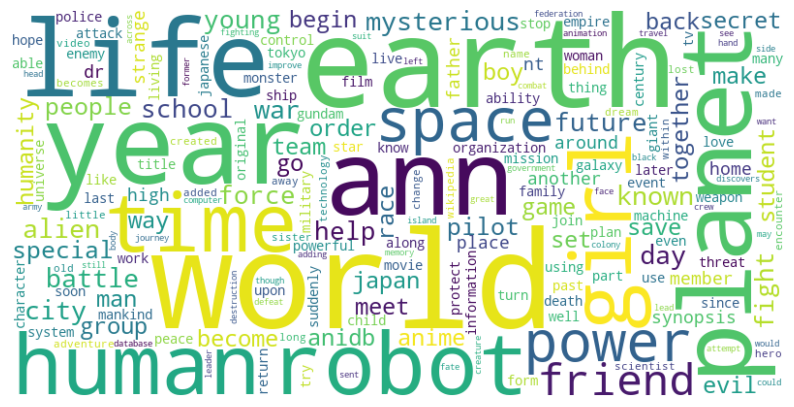

In [51]:
generate_wordcloud(synopsis_3)

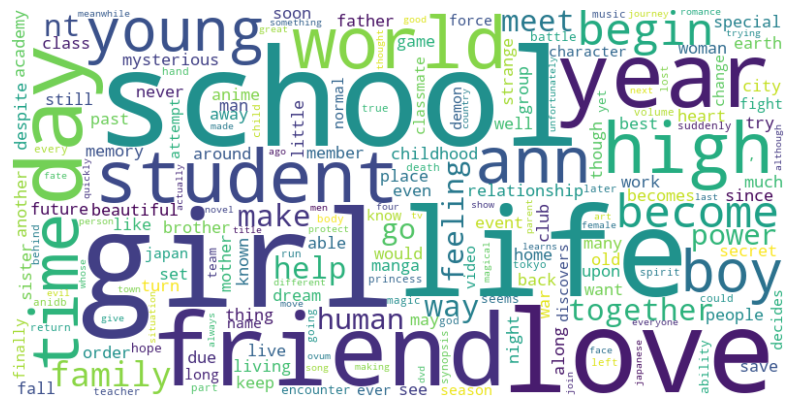

In [52]:
generate_wordcloud(synopsis_4)

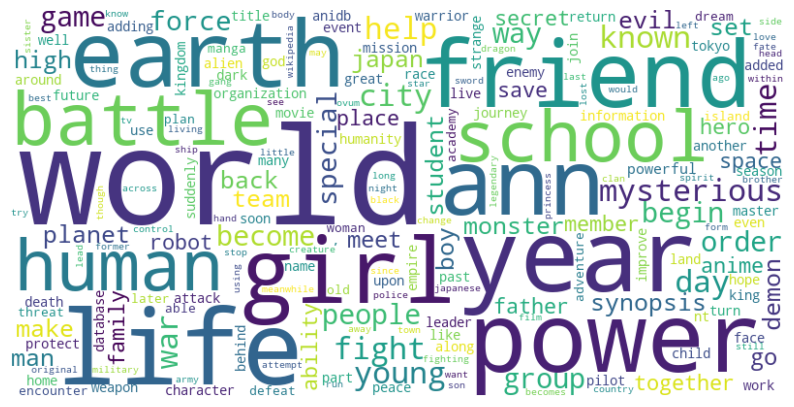

In [53]:
generate_wordcloud(synopsis_5)

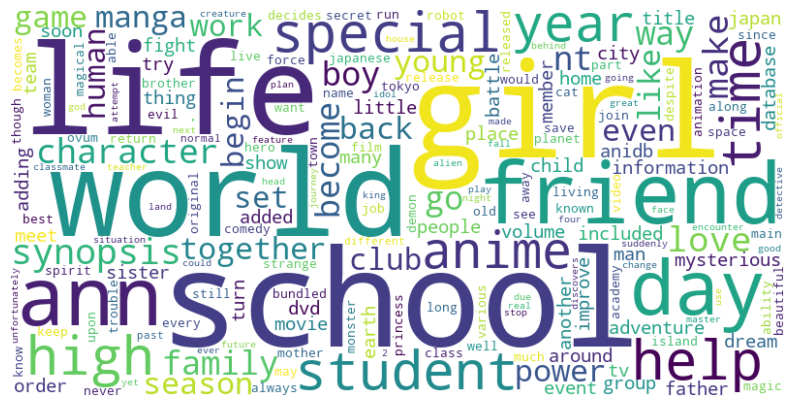

In [54]:
generate_wordcloud(synopsis_6)